# Generative Adversarial Networks Master Notebook

In [1]:
import torch
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

%load_ext autoreload
%autoreload 2

In [2]:
from gan.train import train

In [3]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "gpu")

# GAN loss functions

The generator loss is given by:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$

The discriminator loss is:

$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$




In [4]:
from gan.losses import discriminator_loss, generator_loss

### Least Squares GAN loss


$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$


$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$

In [5]:
from gan.losses import ls_discriminator_loss, ls_generator_loss

# GAN model architecture

The architecture used here is inspired from [DCGAN](https://arxiv.org/pdf/1511.06434.pdf):

**Discriminator:**

- convolutional layer with in_channels=3, out_channels=128, kernel=4, stride=2
- convolutional layer with in_channels=128, out_channels=256, kernel=4, stride=2
- batch norm
- convolutional layer with in_channels=256, out_channels=512, kernel=4, stride=2
- batch norm
- convolutional layer with in_channels=512, out_channels=1024, kernel=4, stride=2
- batch norm
- convolutional layer with in_channels=1024, out_channels=1, kernel=4, stride=1


**Generator:**

- transpose convolution with in_channels=NOISE_DIM, out_channels=1024, kernel=4, stride=1
- batch norm
- transpose convolution with in_channels=1024, out_channels=512, kernel=4, stride=2
- batch norm
- transpose convolution with in_channels=512, out_channels=256, kernel=4, stride=2
- batch norm
- transpose convolution with in_channels=256, out_channels=128, kernel=4, stride=2
- batch norm
- transpose convolution with in_channels=128, out_channels=3, kernel=4, stride=2

In [6]:
from gan.models import Discriminator, Generator

# Data loading

The cat images we provide are RGB images with a resolution of 64x64. In order to prevent our discriminator from overfitting, we will need to perform some data augmentation.

In [7]:
batch_size = 32
imsize = 64
cat_root = './cats'

cat_train = ImageFolder(root=cat_root, transform=transforms.Compose([
  transforms.ToTensor(),
    
  # Example use of RandomCrop:
  transforms.Resize(int(1.15 * imsize)),
  transforms.RandomCrop(imsize),
]))

cat_loader_train = DataLoader(cat_train, batch_size=batch_size, drop_last=True)

### Visualize dataset

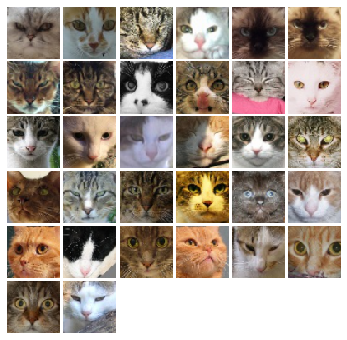

In [8]:
from gan.utils import show_images

imgs = cat_loader_train.__iter__().next()[0].numpy().squeeze()
show_images(imgs, color=True)

# Training the GAN

In [10]:
NOISE_DIM = 100
NUM_EPOCHS = 40
learning_rate = 0.001

In [11]:
D = Discriminator().to(device)
G = Generator(noise_dim=NOISE_DIM).to(device)

In [12]:
D_optimizer = torch.optim.Adam(D.parameters(), lr=learning_rate, betas = (0.5, 0.999))
G_optimizer = torch.optim.Adam(G.parameters(), lr=learning_rate, betas = (0.5, 0.999))

EPOCH:  1
Iter: 0, D: 1.4, G:4.235


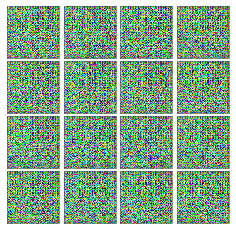


Iter: 250, D: 2.312, G:1.054


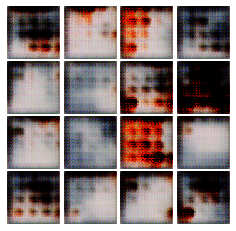


EPOCH:  2
Iter: 500, D: 1.505, G:3.271


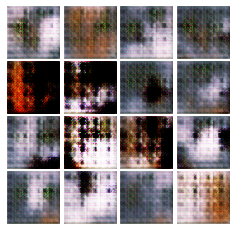


Iter: 750, D: 2.11, G:1.916


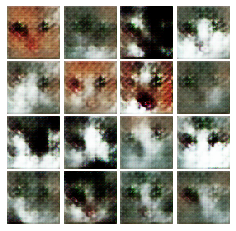


EPOCH:  3
Iter: 1000, D: 1.186, G:1.159


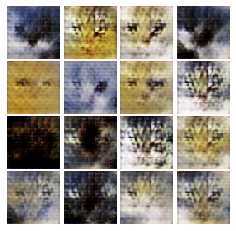


Iter: 1250, D: 1.279, G:2.921


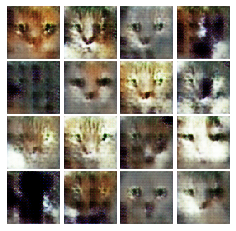


EPOCH:  4
Iter: 1500, D: 1.154, G:1.807


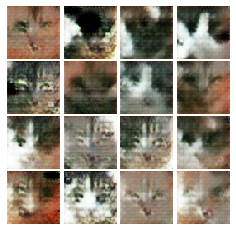


Iter: 1750, D: 1.49, G:2.528


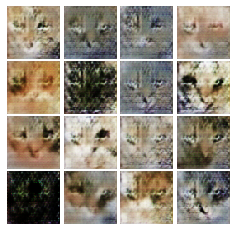


EPOCH:  5
Iter: 2000, D: 1.035, G:2.153


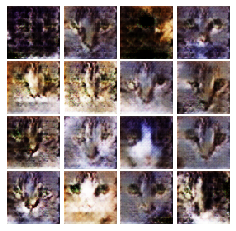


Iter: 2250, D: 0.6852, G:2.085


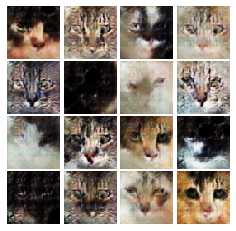


EPOCH:  6
Iter: 2500, D: 1.38, G:2.365


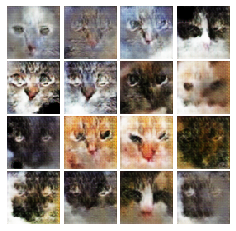


Iter: 2750, D: 0.9013, G:2.868


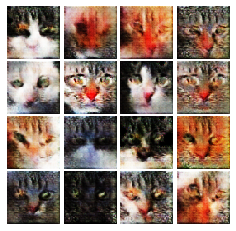


EPOCH:  7
Iter: 3000, D: 0.6953, G:2.932


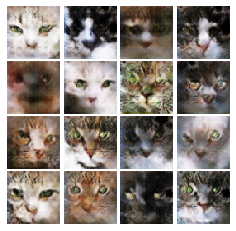


Iter: 3250, D: 0.6919, G:1.849


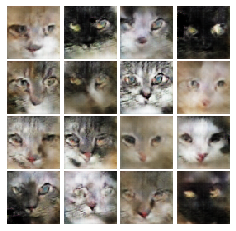


EPOCH:  8
Iter: 3500, D: 0.9601, G:2.682


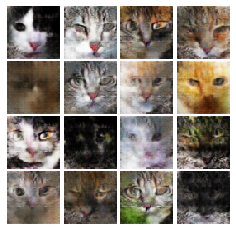


Iter: 3750, D: 0.2076, G:5.641


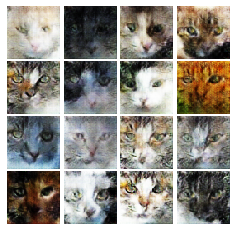


EPOCH:  9
Iter: 4000, D: 0.4516, G:3.646


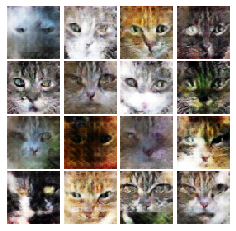


Iter: 4250, D: 0.2512, G:4.843


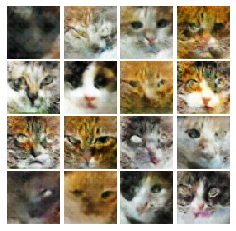


EPOCH:  10
Iter: 4500, D: 0.4318, G:4.22


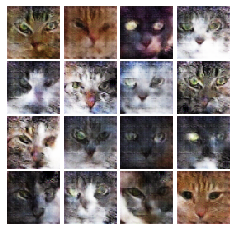


Iter: 4750, D: 0.4512, G:5.505


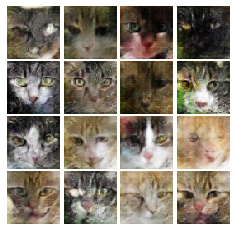


EPOCH:  11
Iter: 5000, D: 0.1876, G:5.116


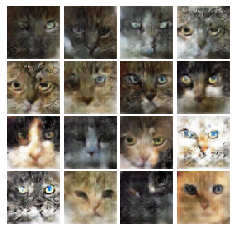


Iter: 5250, D: 0.09054, G:4.66


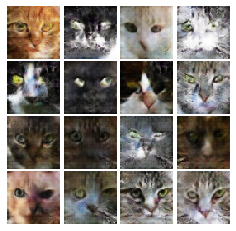


EPOCH:  12
Iter: 5500, D: 0.2572, G:8.409


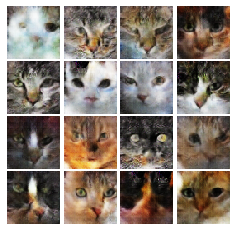


Iter: 5750, D: 0.1381, G:8.294


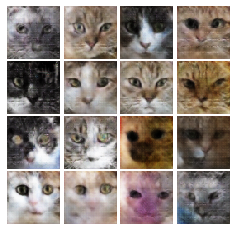


EPOCH:  13
Iter: 6000, D: 0.1621, G:5.567


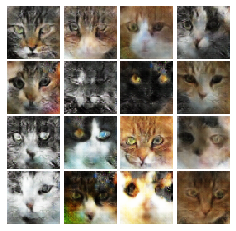


Iter: 6250, D: 0.3376, G:3.801


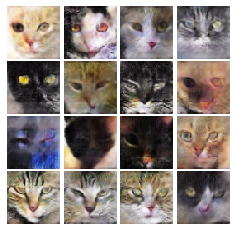


EPOCH:  14
Iter: 6500, D: 0.1443, G:4.865


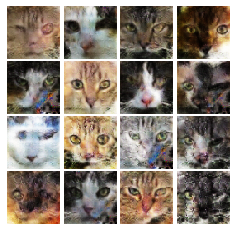


Iter: 6750, D: 0.09479, G:5.064


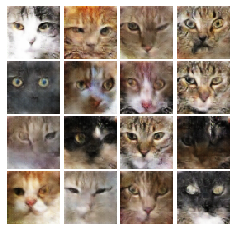


EPOCH:  15
Iter: 7000, D: 0.1671, G:7.364


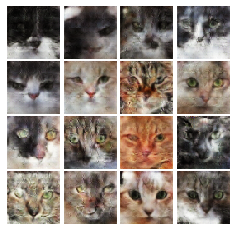


Iter: 7250, D: 0.09706, G:4.771


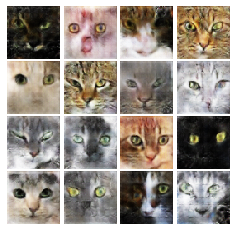


EPOCH:  16
Iter: 7500, D: 0.7477, G:3.424


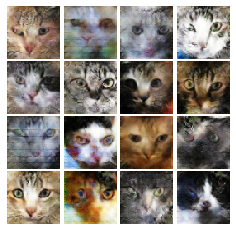


Iter: 7750, D: 0.09987, G:11.87


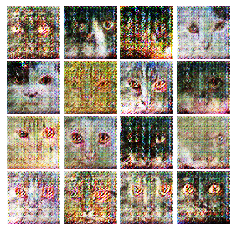


EPOCH:  17
Iter: 8000, D: 0.1614, G:5.047


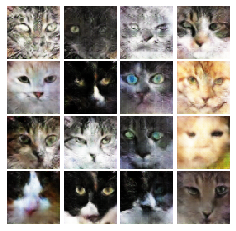


Iter: 8250, D: 0.059, G:5.884


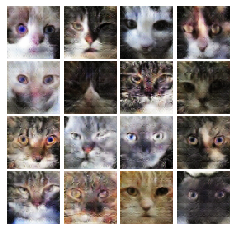


EPOCH:  18
Iter: 8500, D: 0.1173, G:5.606


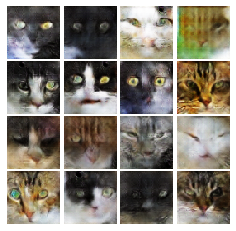


Iter: 8750, D: 0.2686, G:4.731


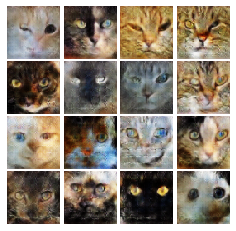


EPOCH:  19
Iter: 9000, D: 0.1279, G:3.432


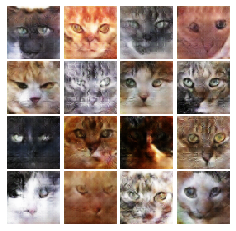


Iter: 9250, D: 0.05451, G:6.21


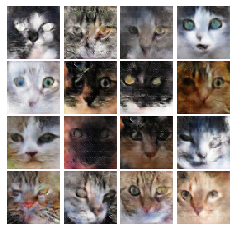


EPOCH:  20
Iter: 9500, D: 0.05845, G:5.402


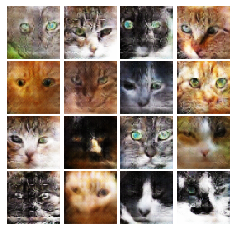


Iter: 9750, D: 0.2482, G:5.015


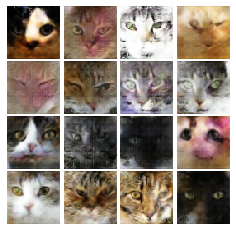


EPOCH:  21
Iter: 10000, D: 0.1413, G:6.018


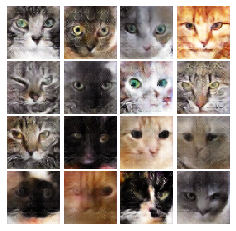


Iter: 10250, D: 0.1, G:5.744


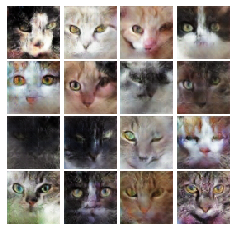


EPOCH:  22
Iter: 10500, D: 0.3746, G:7.94


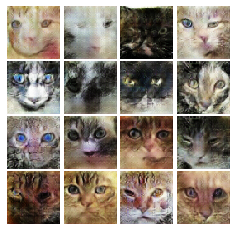


Iter: 10750, D: 0.1242, G:7.764


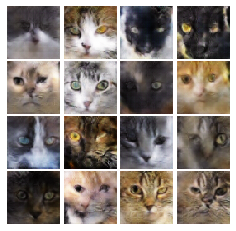


EPOCH:  23
Iter: 11000, D: 0.3039, G:10.22


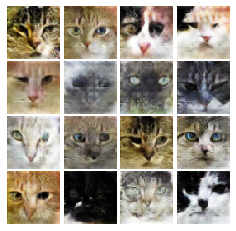


Iter: 11250, D: 0.03844, G:4.681


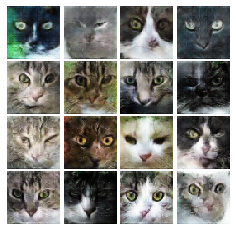


EPOCH:  24
Iter: 11500, D: 0.4473, G:8.839


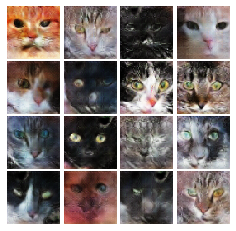


Iter: 11750, D: 0.07748, G:7.026


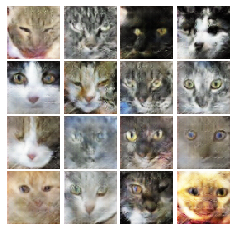


EPOCH:  25
Iter: 12000, D: 0.08051, G:7.227


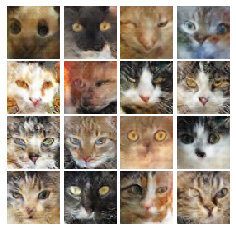


Iter: 12250, D: 0.1581, G:6.247


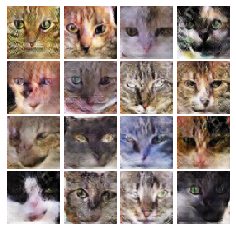


EPOCH:  26
Iter: 12500, D: 0.1213, G:5.432


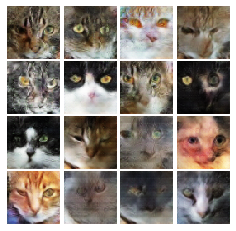


Iter: 12750, D: 0.1138, G:5.194


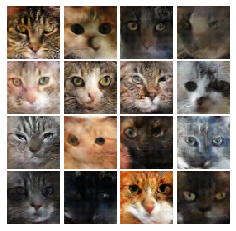


EPOCH:  27
Iter: 13000, D: 0.182, G:4.801


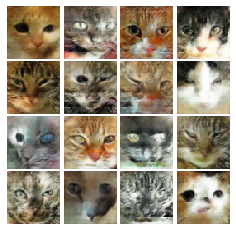


Iter: 13250, D: 1.274, G:6.222


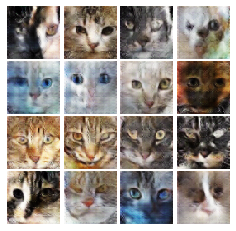


EPOCH:  28
Iter: 13500, D: 0.1004, G:4.851


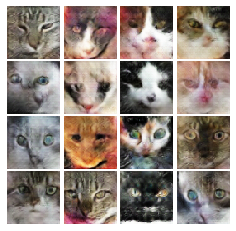


Iter: 13750, D: 0.07671, G:6.668


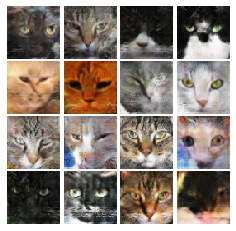


EPOCH:  29
Iter: 14000, D: 0.04117, G:2.478


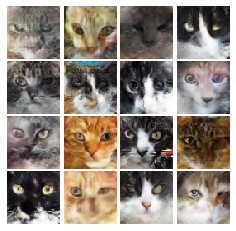


Iter: 14250, D: 0.1642, G:5.273


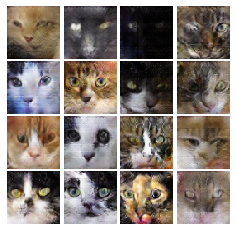


EPOCH:  30
Iter: 14500, D: 0.0576, G:4.864


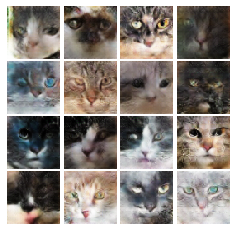


Iter: 14750, D: 0.0662, G:5.431


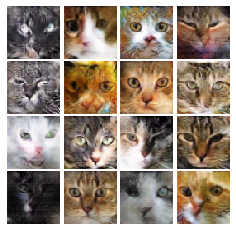


EPOCH:  31
Iter: 15000, D: 0.262, G:9.27


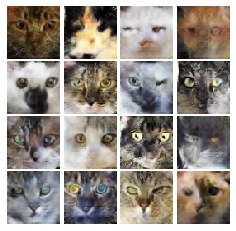


Iter: 15250, D: 0.1085, G:5.782


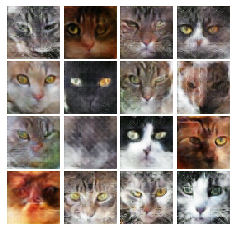


EPOCH:  32
Iter: 15500, D: 0.5277, G:9.869


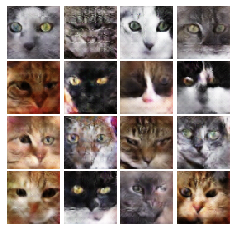


EPOCH:  33
Iter: 15750, D: 0.05699, G:7.572


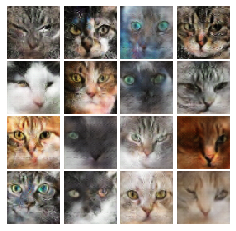

In [ ]:
# original gan
train(D, G, D_optimizer, G_optimizer, discriminator_loss, generator_loss, num_epochs=NUM_EPOCHS, show_every=250, batch_size=batch_size, train_loader=cat_loader_train, device=device)
